# Steel Industry Energy Consumption Prediction

**Task:** to write RNN (RMLP), GRU and LSTM models to predict Usage_kWh. Dataset's [here](http://archive.ics.uci.edu/ml/datasets/Steel+Industry+Energy+Consumption+Dataset).
 Compare the quality of models by MSE, RMSE and $R^2$ and draw conclusions

Sources:
- [1](https://github.com/ibadrather/pytorch_learn/blob/main/Part%2014%20-%20Multivariate%20Timeseries%20Analysis%20using%20Pytorch%20and%20Pytorch%20Lightening.ipynb)
- [2](https://pytorch.org/tutorials/intermediate/char_rnn_classification_tutorial.html)
- [3](https://jmyao17.github.io/Machine_Learning/Sequence/RNN-1.html)
- [4](http://dprogrammer.org/rnn-lstm-gru)

In [1]:
!nvidia-smi

Sun Feb 19 19:00:40 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 510.47.03    Driver Version: 510.47.03    CUDA Version: 11.6     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   59C    P0    27W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
!pip install --quiet pytorch-lightning
!pip install --quiet tqdm
!pip install --quiet torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 826.2/826.2 KB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 517.2/517.2 KB 8.2 MB/s eta 0:00:00


In [3]:
from urllib import request
request.urlretrieve('http://archive.ics.uci.edu/ml/machine-learning-databases/00618/Steel_industry_data.csv', 
                           'Steel_industry_data.csv')

('Steel_industry_data.csv', <http.client.HTTPMessage at 0x7f5be0711eb0>)

In [4]:
import pdb

import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
import math
import matplotlib

import pandas as pd
import numpy as np
from tqdm.notebook import tqdm

import torch
import torch.autograd as autograd
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from torch.utils.data import Dataset, DataLoader, TensorDataset
from sklearn.preprocessing import MinMaxScaler

import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger

from collections import defaultdict

import torchmetrics

pl.seed_everything(42)

INFO:lightning_fabric.utilities.seed:Global seed set to 42


42

In [5]:
df = pd.read_csv('Steel_industry_data.csv', parse_dates=['date'])
df = df.sort_values(by='date').reset_index(drop=True)

In [6]:
df.head()

,date,Usage_kWh,Lagging_Current_Reactive.Power_kVarh,Leading_Current_Reactive_Power_kVarh,CO2(tCO2),Lagging_Current_Power_Factor,Leading_Current_Power_Factor,NSM,WeekStatus,Day_of_week,Load_Type
0,2018-01-01 00:00:00,3.42,3.46,0.0,0.0,70.30,100.0,0,Weekday,Monday,Light_Load
1,2018-01-01 00:15:00,3.17,2.95,0.0,0.0,73.21,100.0,900,Weekday,Monday,Light_Load
2,2018-01-01 00:30:00,4.00,4.46,0.0,0.0,66.77,100.0,1800,Weekday,Monday,Light_Load
3,2018-01-01 00:45:00,3.24,3.28,0.0,0.0,70.28,100.0,2700,Weekday,Monday,Light_Load
4,2018-01-01 01:00:00,3.31,3.56,0.0,0.0,68.09,100.0,3600,Weekday,Monday,Light_Load


In [7]:
df.shape

(35040, 11)

In [8]:
%matplotlib inline
%config InlineBackend.figure_format='retina'

sns.set(style='whitegrid', palette='muted', font_scale=1.2)

HAPPY_COLORS_PALETTE = ["#01BEFE", "#FFDD00", "#FF7D00", "#FF006D", "#93D30C", "#8F00FF"]

sns.set_palette(sns.color_palette(HAPPY_COLORS_PALETTE))

rcParams['figure.figsize'] = 14, 10

tqdm.pandas()

## Preprocessing

Let us predict the difference of Usage_kWh values by creating a new feature with this information

In [9]:
df['Usage_kWh_next'] = df.shift(1)['Usage_kWh']

In [10]:
df['Usage_kWh_diff'] = df.progress_apply(
    lambda row: 0 if np.isnan(row['Usage_kWh_next']) else row['Usage_kWh_next'] - row['Usage_kWh'],
    axis=1
)

  0%|          | 0/35040 [00:00<?, ?it/s]

Now let's extract the features from the date and time

In [11]:
df['day_of_week'] = df.progress_apply(
    lambda row: row.date.day_of_week,
    axis=1
)
df['day_of_month'] = df.progress_apply(
    lambda row: row.date.day,
    axis=1
)
df['month'] = df.progress_apply(
    lambda row: row.date.month,
    axis=1
)
df['week_of_year'] = df.progress_apply(
    lambda row: row.date.week,
    axis=1
)

  0%|          | 0/35040 [00:00<?, ?it/s]

  0%|          | 0/35040 [00:00<?, ?it/s]

  0%|          | 0/35040 [00:00<?, ?it/s]

  0%|          | 0/35040 [00:00<?, ?it/s]

In [12]:
df = df.drop(['date', 'Usage_kWh', 'Usage_kWh_next'], axis=1)

Categorical attributes must be converted into numerical attributes

In [13]:
df = pd.get_dummies(df, columns=['WeekStatus', 'Day_of_week', 'Load_Type'])

In [14]:
df.head()

,Lagging_Current_Reactive.Power_kVarh,Leading_Current_Reactive_Power_kVarh,CO2(tCO2),Lagging_Current_Power_Factor,Leading_Current_Power_Factor,NSM,Usage_kWh_diff,day_of_week,day_of_month,month,...,Day_of_week_Friday,Day_of_week_Monday,Day_of_week_Saturday,Day_of_week_Sunday,Day_of_week_Thursday,Day_of_week_Tuesday,Day_of_week_Wednesday,Load_Type_Light_Load,Load_Type_Maximum_Load,Load_Type_Medium_Load
0,3.46,0.0,0.0,70.30,100.0,0,0.00,0,1,1,...,0,1,0,0,0,0,0,1,0,0
1,2.95,0.0,0.0,73.21,100.0,900,0.25,0,1,1,...,0,1,0,0,0,0,0,1,0,0
2,4.46,0.0,0.0,66.77,100.0,1800,-0.83,0,1,1,...,0,1,0,0,0,0,0,1,0,0
3,3.28,0.0,0.0,70.28,100.0,2700,0.76,0,1,1,...,0,1,0,0,0,0,0,1,0,0
4,3.56,0.0,0.0,68.09,100.0,3600,-0.07,0,1,1,...,0,1,0,0,0,0,0,1,0,0


## Data split

In [15]:
split_ratio = 0.8
train_size = int(len(df) * split_ratio)
val_size = (len(df) - train_size) // 2
print(train_size, val_size)

28032 3504


In [16]:
train_df, val_df, test_df = df[:train_size], df[train_size+1:train_size+val_size], df[train_size+val_size+1:]
train_df.shape, val_df.shape, test_df.shape

((28032, 23), (3503, 23), (3503, 23))

Normalize the data

In [17]:
scaler = MinMaxScaler(feature_range=(-1, 1))
scaler = scaler.fit(train_df)

In [18]:
train_df = pd.DataFrame(
    scaler.transform(train_df),
    index = train_df.index,
    columns = train_df.columns
)
train_df.head()

,Lagging_Current_Reactive.Power_kVarh,Leading_Current_Reactive_Power_kVarh,CO2(tCO2),Lagging_Current_Power_Factor,Leading_Current_Power_Factor,NSM,Usage_kWh_diff,day_of_week,day_of_month,month,...,Day_of_week_Friday,Day_of_week_Monday,Day_of_week_Saturday,Day_of_week_Sunday,Day_of_week_Thursday,Day_of_week_Tuesday,Day_of_week_Wednesday,Load_Type_Light_Load,Load_Type_Maximum_Load,Load_Type_Medium_Load
0,-0.928594,-1.0,-1.0,0.4060,1.0,-1.000000,-0.090018,-1.0,-1.0,-1.0,...,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0
1,-0.939119,-1.0,-1.0,0.4642,1.0,-0.978947,-0.087790,-1.0,-1.0,-1.0,...,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0
2,-0.907956,-1.0,-1.0,0.3354,1.0,-0.957895,-0.097415,-1.0,-1.0,-1.0,...,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0
3,-0.932308,-1.0,-1.0,0.4056,1.0,-0.936842,-0.083244,-1.0,-1.0,-1.0,...,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0
4,-0.926530,-1.0,-1.0,0.3618,1.0,-0.915789,-0.090642,-1.0,-1.0,-1.0,...,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0


In [19]:
val_df = pd.DataFrame(
    scaler.transform(val_df),
    index = val_df.index,
    columns = val_df.columns
)
val_df.head()

,Lagging_Current_Reactive.Power_kVarh,Leading_Current_Reactive_Power_kVarh,CO2(tCO2),Lagging_Current_Power_Factor,Leading_Current_Power_Factor,NSM,Usage_kWh_diff,day_of_week,day_of_month,month,...,Day_of_week_Friday,Day_of_week_Monday,Day_of_week_Saturday,Day_of_week_Sunday,Day_of_week_Thursday,Day_of_week_Tuesday,Day_of_week_Wednesday,Load_Type_Light_Load,Load_Type_Maximum_Load,Load_Type_Medium_Load
28033,-0.055619,-1.0,-0.142857,0.6298,1.0,-0.978947,-0.638324,0.666667,0.266667,1.0,...,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0
28034,-0.366216,-1.0,-0.428571,0.6546,1.0,-0.957895,0.080303,0.666667,0.266667,1.0,...,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0
28035,-0.647921,-1.0,-0.714286,0.5164,1.0,-0.936842,0.136185,0.666667,0.266667,1.0,...,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0
28036,-0.841709,-1.0,-1.000000,0.3576,1.0,-0.915789,0.023619,0.666667,0.266667,1.0,...,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0
28037,-0.854298,-1.0,-1.000000,0.2590,1.0,-0.894737,-0.077807,0.666667,0.266667,1.0,...,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0


In [20]:
test_df = pd.DataFrame(
    scaler.transform(test_df),
    index = test_df.index,
    columns = test_df.columns
)
test_df.head()

,Lagging_Current_Reactive.Power_kVarh,Leading_Current_Reactive_Power_kVarh,CO2(tCO2),Lagging_Current_Power_Factor,Leading_Current_Power_Factor,NSM,Usage_kWh_diff,day_of_week,day_of_month,month,...,Day_of_week_Friday,Day_of_week_Monday,Day_of_week_Saturday,Day_of_week_Sunday,Day_of_week_Thursday,Day_of_week_Tuesday,Day_of_week_Wednesday,Load_Type_Light_Load,Load_Type_Maximum_Load,Load_Type_Medium_Load
31537,-1.0,-0.009366,-1.0,1.0,-0.5602,0.031579,-0.090998,1.0,0.6,1.222222,...,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0
31538,-1.0,-0.017291,-1.0,1.0,-0.5676,0.052632,-0.089305,1.0,0.6,1.222222,...,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0
31539,-1.0,0.055476,-1.0,1.0,-0.5770,0.073684,-0.091355,1.0,0.6,1.222222,...,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0
31540,-1.0,0.452450,-1.0,1.0,-0.6380,0.094737,-0.094831,1.0,0.6,1.222222,...,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0
31541,-1.0,0.478386,-1.0,1.0,-0.6478,0.115789,-0.089661,1.0,0.6,1.222222,...,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0


For training, we need to slice the dataset into sequences

In [21]:
def create_sequences(input_data: pd.DataFrame, target_column, sequence_length=3):
  sequences = []
  data_size = len(input_data)

  for i in tqdm(range(data_size - sequence_length)):
    sequence = input_data[i:i+sequence_length]
    label_position = i + sequence_length
    label = input_data.iloc[label_position][target_column]

    sequences.append((sequence, label))

  return sequences

In [22]:
SEQUENCE_LENGTH = 120

In [23]:
train_sequences = create_sequences(train_df, 'Usage_kWh_diff', sequence_length=SEQUENCE_LENGTH)
val_sequences = create_sequences(val_df, 'Usage_kWh_diff', sequence_length=SEQUENCE_LENGTH)
test_sequences = create_sequences(test_df, 'Usage_kWh_diff', sequence_length=SEQUENCE_LENGTH)

  0%|          | 0/27912 [00:00<?, ?it/s]

  0%|          | 0/3383 [00:00<?, ?it/s]

  0%|          | 0/3383 [00:00<?, ?it/s]

In [24]:
print("Label: ", train_sequences[0][1])
print("")
print("Sequence: ",train_sequences[0][0])
print("Sequence Shape: ",train_sequences[0][0].shape)

Label:  -0.09001782531194302

Sequence:       Lagging_Current_Reactive.Power_kVarh  \
0                               -0.928594   
1                               -0.939119   
2                               -0.907956   
3                               -0.932308   
4                               -0.926530   
..                                    ...   
115                             -0.880301   
116                             -0.908575   
117                             -0.910845   
118                             -0.913734   
119                             -0.912290   

     Leading_Current_Reactive_Power_kVarh  CO2(tCO2)  \
0                                    -1.0       -1.0   
1                                    -1.0       -1.0   
2                                    -1.0       -1.0   
3                                    -1.0       -1.0   
4                                    -1.0       -1.0   
..                                    ...        ...   
115                       

In [25]:
len(train_sequences), len(val_sequences), len(test_sequences)

(27912, 3383, 3383)

## Dataset creation

Let's create a custom dataset

In [26]:
class EnergyUsageDataset(Dataset):
  def __init__(self, sequences):
    self.sequences = sequences

  def __len__(self):
    return len(self.sequences)

  def __getitem__(self, idx):
    sequence, label = self.sequences[idx]
    return dict(
        sequence=torch.Tensor(sequence.to_numpy()).float(),
        label=torch.tensor(label).float()
    )

Simple sanity test

In [27]:
ds = EnergyUsageDataset(test_sequences)
assert ds[0]['sequence'].shape == (SEQUENCE_LENGTH, 23)

Now we create a DataModule for train and test data

In [28]:
class EnergyUsageDataModule(pl.LightningDataModule):
  def __init__(self, 
               train_sequences, 
               val_sequences, 
               test_sequences, 
               batch_size=8,
               shuffle=False):
    super().__init__()
    self.train_sequences = train_sequences
    self.val_sequences = val_sequences
    self.test_sequences = test_sequences
    self.batch_size = batch_size
    self.shuffle = shuffle

  def setup(self, stage=None):
    self.train_dataset = EnergyUsageDataset(train_sequences)
    self.val_dataset = EnergyUsageDataset(val_sequences)
    self.test_dataset = EnergyUsageDataset(test_sequences)

  def train_dataloader(self):
    return DataLoader(
        self.train_dataset,
        batch_size=self.batch_size, 
        shuffle=self.shuffle
    )

  def val_dataloader(self):
    return DataLoader(
        self.val_dataset,
        batch_size=self.batch_size, 
        shuffle=self.shuffle
    )

  def test_dataloader(self):
    return DataLoader(
        self.test_dataset,
        batch_size=self.batch_size, 
        shuffle=self.shuffle
    )

## Model creation

Let's recall architecture of RNN, LSTM, GRU models

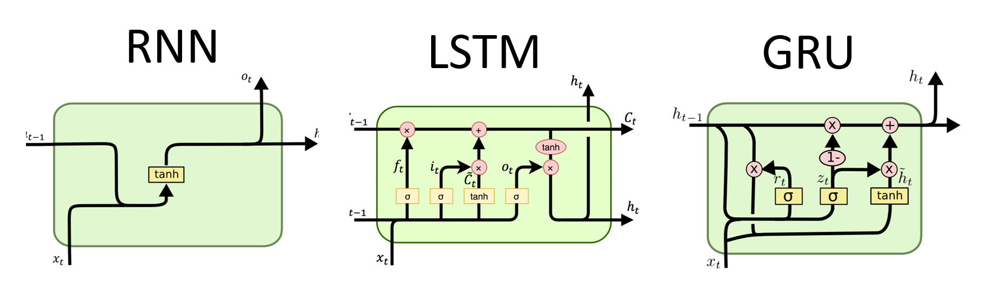

### RNN

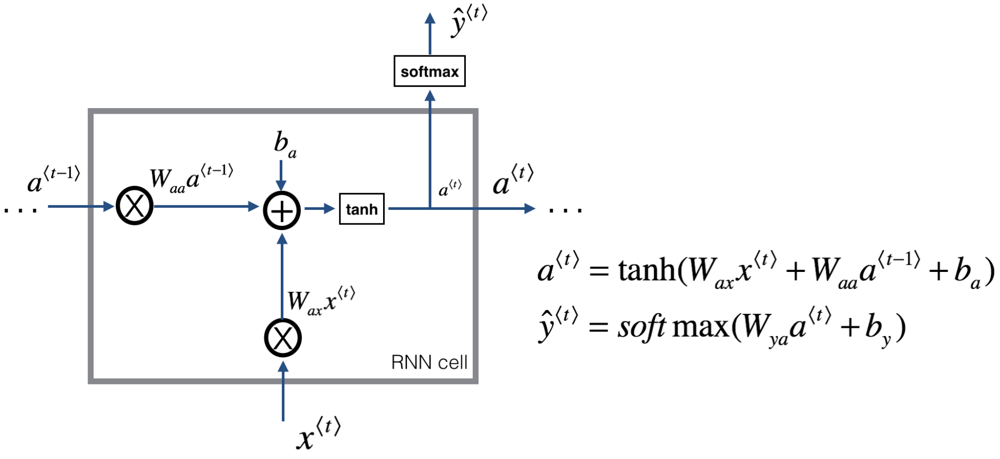

In [29]:
def init_value(n_batch, n_values):
  return nn.init.kaiming_uniform_(torch.empty(n_batch, n_values))

In [30]:
class RNN(nn.Module):
  def __init__(self,
               n_features,
               n_hidden):
    super().__init__()

    self.n_features = n_features
    self.n_hidden = n_hidden

    self.h2h = nn.Linear(n_hidden, n_hidden)
    self.i2h = nn.Linear(n_features, n_hidden)
    self.h2o = nn.Linear(n_hidden, 1)
    self.tanh = nn.Tanh()

  def forward(self, x):
    n_batch = x.shape[0]
    hidden = init_value(n_batch, self.n_hidden).to(x.device)

    for xi in x.transpose(0, 1):
      hidden = self.tanh(self.h2h(hidden) + self.i2h(xi))
      output = self.tanh(self.h2o(hidden))

    return output

### LSTM

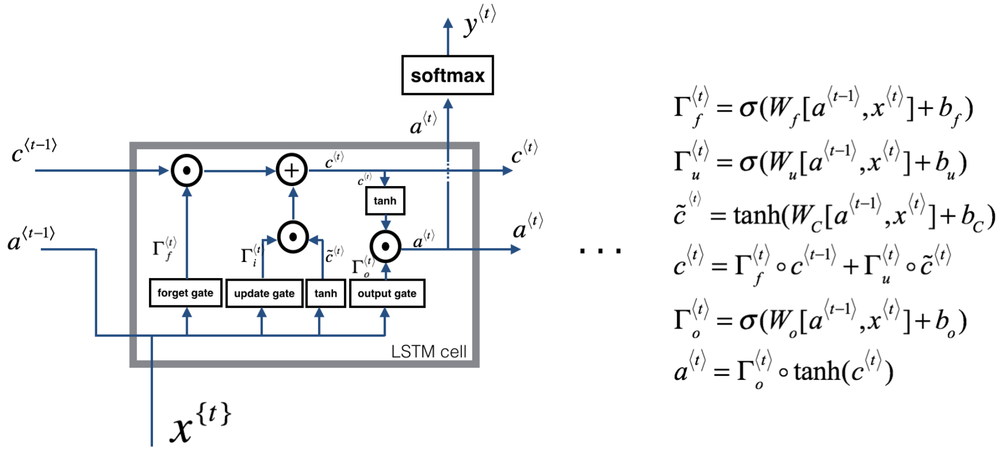

In [31]:
class LSTM(nn.Module):
  def __init__(self,
               n_features,
               n_hidden):
    super().__init__()

    self.n_features = n_features
    self.n_hidden = n_hidden

    self.tanh = nn.Tanh()
    self.sigmoid = nn.Sigmoid()

    self.forget_gate = nn.Linear(n_features + n_hidden, n_hidden)
    self.update_gate = nn.Linear(n_features + n_hidden, n_hidden)
    self.update_cell = nn.Linear(n_features + n_hidden, n_hidden)
    self.output_gate = nn.Linear(n_features + n_hidden, n_hidden)
    self.output_layer = nn.Linear(n_hidden, 1)

  def forward(self, x):
    n_batch = x.shape[0]
    hidden = init_value(n_batch, self.n_hidden).to(x.device)
    cell = init_value(n_batch, self.n_hidden).to(x.device)

    for xi in x.transpose(0, 1):
      concatenated = torch.cat((hidden, xi), 1)
      assert concatenated.shape[1] == hidden.shape[1] + xi.shape[1]
      assert concatenated.shape[0] == n_batch

      # forget gate
      cell = torch.mul(
          cell, 
          self.sigmoid(self.forget_gate(concatenated))
      )

      # update gate
      cell = cell + torch.mul(
          self.sigmoid(self.update_gate(concatenated)),
          self.tanh(self.update_cell(concatenated))
      )

      # output gate
      hidden = torch.mul(
          self.tanh(cell),
          self.sigmoid(self.output_gate(concatenated))
      )
      output = self.tanh(self.output_layer(hidden))

    return output

### GRU

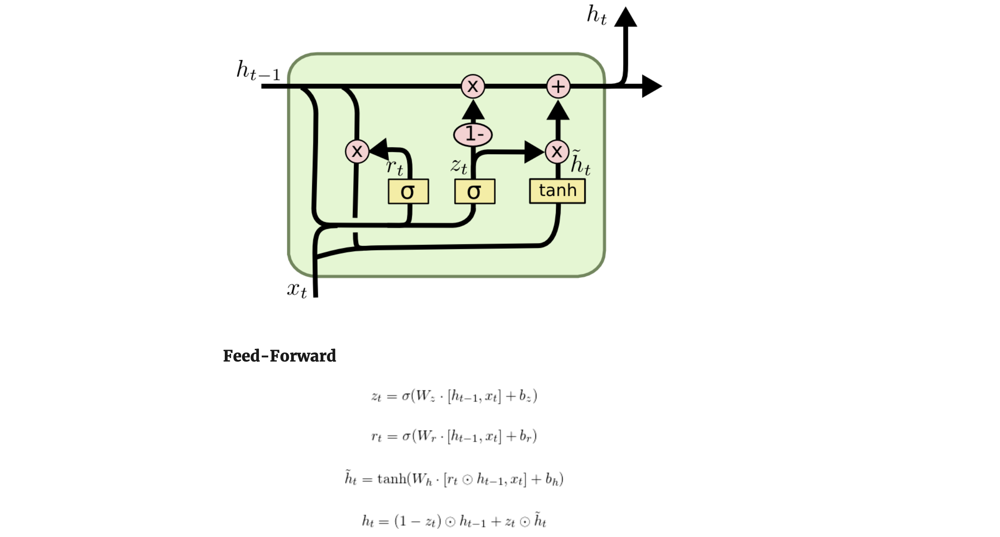

In [32]:
class GRU(nn.Module):
  def __init__(self,
               n_features,
               n_hidden):
    super().__init__()

    self.n_features = n_features
    self.n_hidden = n_hidden

    self.tanh = nn.Tanh()
    self.sigmoid = nn.Sigmoid()

    self.r = nn.Linear(n_features + n_hidden, n_hidden)
    self.z = nn.Linear(n_features + n_hidden, n_hidden)
    self.h = nn.Linear(n_features + n_hidden, n_hidden)
    self.output_layer = nn.Linear(n_hidden, 1)

  def forward(self, x):
    n_batch = x.shape[0]
    hidden = init_value(n_batch, self.n_hidden).to(x.device)

    for xi in x.transpose(0, 1):
      concat1 = torch.cat((hidden, xi), 1)

      r = self.sigmoid(self.r(concat1))

      z = self.sigmoid(self.z(concat1))

      concat2 = torch.cat((torch.mul(hidden, r), xi), 1)
      h_tilde = self.tanh(self.h(concat2))

      hidden = torch.mul(1-z, hidden) + torch.mul(z, h_tilde)

      output = self.tanh(self.output_layer(hidden))

    return output

### Pytorch Lightning Module

After creating a model, we need to create a model wrapper module to train it in pytorch-lightning

In [33]:
class EnergyUsageModel(pl.LightningModule):
  def __init__(self, 
               n_features, 
               n_hidden,
               learning_rate, 
               model_name):
    super().__init__()
    self.criterion = nn.MSELoss()
    self.learning_rate = learning_rate
    self.model_name = model_name
    self.n_features = n_features
    self.n_hidden = n_hidden

    self.mse = torchmetrics.MeanSquaredError(squared=True)
    self.rmse = torchmetrics.MeanSquaredError(squared=False)
    self.r2 = torchmetrics.R2Score()

    if self.model_name == 'RNN':
      self.model = RNN(n_features, n_hidden)
    elif self.model_name == 'LSTM':
      self.model = LSTM(n_features, n_hidden)
    elif self.model_name == 'GRU':
      self.model = GRU(n_features, n_hidden)
    else:
      raise ValueError('No such model name!')

  def forward(self, x, labels=None):
    output = self.model(x)
    loss = 0
    if labels is not None:
      loss = self.criterion(output, labels.unsqueeze(dim=1))
    return loss, output

  def training_step(self, batch, batch_idx):
    sequences = batch['sequence']
    labels = batch['label']

    loss, output = self.forward(sequences, labels)

    self.log_dict(
        dict(
            train_loss=loss,
        ),
        prog_bar=True, 
        logger=True
    )

    return loss

  def validation_step(self, batch, batch_idx):
    sequences = batch['sequence']
    labels = batch['label']

    loss, output = self.forward(sequences, labels)

    self.log_dict(
        dict(
            val_loss=loss,
        ),
        prog_bar=True, 
        logger=True
    )

    return loss

  def test_step(self, batch, batch_idx):
    sequences = batch['sequence']
    labels = batch['label']

    loss, output = self.forward(sequences, labels)

    self.log_dict(
        dict(
            test_loss=loss,
            test_mse=self.mse(output.squeeze(dim=1), labels),
            test_rmse=self.rmse(output.squeeze(dim=1), labels),
            test_r2=self.r2(output.squeeze(dim=1), labels)
        ),
        prog_bar=True, 
        logger=True
    )

    return loss

  def configure_optimizers(self):
    optimizer = optim.AdamW(self.model.parameters(), lr=self.learning_rate)
    return optimizer

Let's set parameters, create the data module and the model itself

In [34]:
BATCH_SIZE = 512
N_EPOCHS = 80
LEARNING_RATE = 0.0003
N_HIDDEN = 128
PATIENCE = 5

## Model training

To train all three models at once one by one, it is convenient to create a function with the argument of the model name. Let's add callbacks to create a checkpoint of the best model by the value of loss function on validation dataset and to early stopping

In [35]:
def train(model_name):
  checkpoint_callback = ModelCheckpoint(
    dirpath=f'checkpoints_{model_name}',
    filename='best_checkpoint',
    save_top_k=1,
    verbose=True,
    monitor='val_loss',
    mode='min'
  )

  early_stopping_callback = EarlyStopping(
      monitor='val_loss',
      patience=PATIENCE
  )

  data_module = EnergyUsageDataModule(
    train_sequences, 
    val_sequences, 
    test_sequences, 
    batch_size=BATCH_SIZE
  )
  data_module.setup()

  model = EnergyUsageModel(n_features=train_df.shape[1], 
                           learning_rate=LEARNING_RATE,
                           model_name=model_name,
                           n_hidden=N_HIDDEN)
  
  logger = TensorBoardLogger('lightning_logs', name=f'energy_usage_{model_name}')

  trainer = pl.Trainer(
    logger=logger,
    callbacks=[
        checkpoint_callback, 
        early_stopping_callback
    ],
    max_epochs=N_EPOCHS,
    accelerator='gpu', 
    devices=1
  )

  trainer.fit(model, data_module)
  trainer.test(model, datamodule=data_module)

In [36]:
train('RNN')

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name      | Type             | Params
-----------------------------------------------
0 | criterion | MSELoss          | 0     
1 | mse       | MeanSquaredError | 0     
2 | rmse      | MeanSquaredError | 0     
3 | r2        | R2Score          | 0     
4 | model     | RNN              | 19.7 K
-----------------------------------------------
19.7 K    Trainable params
0         Non-trainable params
19.7 K    Total params
0.079     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 55: 'val_loss' reached 0.01854 (best 0.01854), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 110: 'val_loss' reached 0.01702 (best 0.01702), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 165: 'val_loss' reached 0.01650 (best 0.01650), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 220: 'val_loss' reached 0.01628 (best 0.01628), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 4, global step 275: 'val_loss' reached 0.01621 (best 0.01621), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 5, global step 330: 'val_loss' reached 0.01613 (best 0.01613), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 6, global step 385: 'val_loss' reached 0.01606 (best 0.01606), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 7, global step 440: 'val_loss' reached 0.01599 (best 0.01599), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 8, global step 495: 'val_loss' reached 0.01592 (best 0.01592), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 9, global step 550: 'val_loss' reached 0.01585 (best 0.01585), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 10, global step 605: 'val_loss' reached 0.01578 (best 0.01578), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 11, global step 660: 'val_loss' reached 0.01571 (best 0.01571), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 12, global step 715: 'val_loss' reached 0.01563 (best 0.01563), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 13, global step 770: 'val_loss' reached 0.01554 (best 0.01554), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 14, global step 825: 'val_loss' reached 0.01545 (best 0.01545), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 15, global step 880: 'val_loss' reached 0.01535 (best 0.01535), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 16, global step 935: 'val_loss' reached 0.01523 (best 0.01523), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 17, global step 990: 'val_loss' reached 0.01510 (best 0.01510), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 18, global step 1045: 'val_loss' reached 0.01496 (best 0.01496), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 19, global step 1100: 'val_loss' reached 0.01481 (best 0.01481), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 20, global step 1155: 'val_loss' reached 0.01464 (best 0.01464), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 21, global step 1210: 'val_loss' reached 0.01445 (best 0.01445), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 22, global step 1265: 'val_loss' reached 0.01426 (best 0.01426), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 23, global step 1320: 'val_loss' reached 0.01404 (best 0.01404), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 24, global step 1375: 'val_loss' reached 0.01381 (best 0.01381), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 25, global step 1430: 'val_loss' reached 0.01356 (best 0.01356), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 26, global step 1485: 'val_loss' reached 0.01331 (best 0.01331), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 27, global step 1540: 'val_loss' reached 0.01306 (best 0.01306), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 28, global step 1595: 'val_loss' reached 0.01284 (best 0.01284), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 29, global step 1650: 'val_loss' reached 0.01264 (best 0.01264), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 30, global step 1705: 'val_loss' reached 0.01246 (best 0.01246), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 31, global step 1760: 'val_loss' reached 0.01233 (best 0.01233), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 32, global step 1815: 'val_loss' reached 0.01222 (best 0.01222), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 33, global step 1870: 'val_loss' reached 0.01213 (best 0.01213), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 34, global step 1925: 'val_loss' reached 0.01205 (best 0.01205), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 35, global step 1980: 'val_loss' reached 0.01196 (best 0.01196), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 36, global step 2035: 'val_loss' reached 0.01188 (best 0.01188), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 37, global step 2090: 'val_loss' reached 0.01180 (best 0.01180), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 38, global step 2145: 'val_loss' reached 0.01173 (best 0.01173), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 39, global step 2200: 'val_loss' reached 0.01167 (best 0.01167), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 40, global step 2255: 'val_loss' reached 0.01161 (best 0.01161), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 41, global step 2310: 'val_loss' reached 0.01157 (best 0.01157), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 42, global step 2365: 'val_loss' reached 0.01153 (best 0.01153), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 43, global step 2420: 'val_loss' reached 0.01150 (best 0.01150), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 44, global step 2475: 'val_loss' reached 0.01147 (best 0.01147), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 45, global step 2530: 'val_loss' reached 0.01145 (best 0.01145), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 46, global step 2585: 'val_loss' reached 0.01143 (best 0.01143), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 47, global step 2640: 'val_loss' reached 0.01141 (best 0.01141), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 48, global step 2695: 'val_loss' reached 0.01138 (best 0.01138), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 49, global step 2750: 'val_loss' reached 0.01136 (best 0.01136), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 50, global step 2805: 'val_loss' reached 0.01133 (best 0.01133), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 51, global step 2860: 'val_loss' reached 0.01130 (best 0.01130), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 52, global step 2915: 'val_loss' reached 0.01127 (best 0.01127), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 53, global step 2970: 'val_loss' reached 0.01124 (best 0.01124), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 54, global step 3025: 'val_loss' reached 0.01121 (best 0.01121), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 55, global step 3080: 'val_loss' reached 0.01118 (best 0.01118), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 56, global step 3135: 'val_loss' reached 0.01115 (best 0.01115), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 57, global step 3190: 'val_loss' reached 0.01112 (best 0.01112), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 58, global step 3245: 'val_loss' reached 0.01110 (best 0.01110), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 59, global step 3300: 'val_loss' reached 0.01107 (best 0.01107), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 60, global step 3355: 'val_loss' reached 0.01105 (best 0.01105), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 61, global step 3410: 'val_loss' reached 0.01102 (best 0.01102), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 62, global step 3465: 'val_loss' reached 0.01100 (best 0.01100), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 63, global step 3520: 'val_loss' reached 0.01098 (best 0.01098), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 64, global step 3575: 'val_loss' reached 0.01095 (best 0.01095), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 65, global step 3630: 'val_loss' reached 0.01093 (best 0.01093), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 66, global step 3685: 'val_loss' reached 0.01091 (best 0.01091), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 67, global step 3740: 'val_loss' reached 0.01089 (best 0.01089), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 68, global step 3795: 'val_loss' reached 0.01086 (best 0.01086), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 69, global step 3850: 'val_loss' reached 0.01084 (best 0.01084), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 70, global step 3905: 'val_loss' reached 0.01083 (best 0.01083), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 71, global step 3960: 'val_loss' reached 0.01081 (best 0.01081), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 72, global step 4015: 'val_loss' reached 0.01079 (best 0.01079), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 73, global step 4070: 'val_loss' reached 0.01078 (best 0.01078), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 74, global step 4125: 'val_loss' reached 0.01077 (best 0.01077), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 75, global step 4180: 'val_loss' reached 0.01076 (best 0.01076), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 76, global step 4235: 'val_loss' reached 0.01075 (best 0.01075), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 77, global step 4290: 'val_loss' reached 0.01074 (best 0.01074), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 78, global step 4345: 'val_loss' reached 0.01073 (best 0.01073), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 79, global step 4400: 'val_loss' reached 0.01072 (best 0.01072), saving model to '/content/checkpoints_RNN/best_checkpoint.ckpt' as top 1
INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=80` reached.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_loss          0.008577925153076649
        test_mse           0.008577925153076649
         test_r2            -1.209628701210022
        test_rmse           0.09117578715085983
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [37]:
train('LSTM')

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name      | Type             | Params
-----------------------------------------------
0 | criterion | MSELoss          | 0     
1 | mse       | MeanSquaredError | 0     
2 | rmse      | MeanSquaredError | 0     
3 | r2        | R2Score          | 0     
4 | model     | LSTM             | 78.0 K
-----------------------------------------------
78.0 K    Trainable params
0         Non-trainable params
78.0 K    Total params
0.312     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 55: 'val_loss' reached 0.01646 (best 0.01646), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 110: 'val_loss' reached 0.01608 (best 0.01608), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 165: 'val_loss' reached 0.01575 (best 0.01575), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 220: 'val_loss' reached 0.01545 (best 0.01545), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 4, global step 275: 'val_loss' reached 0.01520 (best 0.01520), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 5, global step 330: 'val_loss' reached 0.01494 (best 0.01494), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 6, global step 385: 'val_loss' reached 0.01452 (best 0.01452), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 7, global step 440: 'val_loss' reached 0.01419 (best 0.01419), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 8, global step 495: 'val_loss' reached 0.01388 (best 0.01388), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 9, global step 550: 'val_loss' reached 0.01347 (best 0.01347), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 10, global step 605: 'val_loss' reached 0.01309 (best 0.01309), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 11, global step 660: 'val_loss' reached 0.01281 (best 0.01281), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 12, global step 715: 'val_loss' reached 0.01255 (best 0.01255), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 13, global step 770: 'val_loss' reached 0.01229 (best 0.01229), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 14, global step 825: 'val_loss' reached 0.01206 (best 0.01206), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 15, global step 880: 'val_loss' reached 0.01189 (best 0.01189), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 16, global step 935: 'val_loss' reached 0.01176 (best 0.01176), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 17, global step 990: 'val_loss' reached 0.01165 (best 0.01165), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 18, global step 1045: 'val_loss' reached 0.01158 (best 0.01158), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 19, global step 1100: 'val_loss' reached 0.01153 (best 0.01153), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 20, global step 1155: 'val_loss' reached 0.01147 (best 0.01147), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 21, global step 1210: 'val_loss' reached 0.01139 (best 0.01139), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 22, global step 1265: 'val_loss' reached 0.01131 (best 0.01131), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 23, global step 1320: 'val_loss' reached 0.01126 (best 0.01126), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 24, global step 1375: 'val_loss' reached 0.01124 (best 0.01124), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 25, global step 1430: 'val_loss' reached 0.01121 (best 0.01121), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 26, global step 1485: 'val_loss' reached 0.01114 (best 0.01114), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 27, global step 1540: 'val_loss' reached 0.01105 (best 0.01105), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 28, global step 1595: 'val_loss' reached 0.01101 (best 0.01101), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 29, global step 1650: 'val_loss' reached 0.01087 (best 0.01087), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 30, global step 1705: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 31, global step 1760: 'val_loss' reached 0.01082 (best 0.01082), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 32, global step 1815: 'val_loss' reached 0.01070 (best 0.01070), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 33, global step 1870: 'val_loss' reached 0.01062 (best 0.01062), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 34, global step 1925: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 35, global step 1980: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 36, global step 2035: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 37, global step 2090: 'val_loss' reached 0.01051 (best 0.01051), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 38, global step 2145: 'val_loss' reached 0.01035 (best 0.01035), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 39, global step 2200: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 40, global step 2255: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 41, global step 2310: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 42, global step 2365: 'val_loss' reached 0.01029 (best 0.01029), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 43, global step 2420: 'val_loss' reached 0.01020 (best 0.01020), saving model to '/content/checkpoints_LSTM/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 44, global step 2475: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 45, global step 2530: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 46, global step 2585: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 47, global step 2640: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 48, global step 2695: 'val_loss' was not in top 1
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_loss          0.009160450659692287
        test_mse           0.009160450659692287
         test_r2           -0.07401830703020096
        test_rmse           0.09182663261890411
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [38]:
train('GRU')

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name      | Type             | Params
-----------------------------------------------
0 | criterion | MSELoss          | 0     
1 | mse       | MeanSquaredError | 0     
2 | rmse      | MeanSquaredError | 0     
3 | r2        | R2Score          | 0     
4 | model     | GRU              | 58.5 K
-----------------------------------------------
58.5 K    Trainable params
0         Non-trainable params
58.5 K    Total params
0.234     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 55: 'val_loss' reached 0.01652 (best 0.01652), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 110: 'val_loss' reached 0.01638 (best 0.01638), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 165: 'val_loss' reached 0.01623 (best 0.01623), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 220: 'val_loss' reached 0.01601 (best 0.01601), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 4, global step 275: 'val_loss' reached 0.01579 (best 0.01579), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 5, global step 330: 'val_loss' reached 0.01557 (best 0.01557), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 6, global step 385: 'val_loss' reached 0.01536 (best 0.01536), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 7, global step 440: 'val_loss' reached 0.01520 (best 0.01520), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 8, global step 495: 'val_loss' reached 0.01507 (best 0.01507), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 9, global step 550: 'val_loss' reached 0.01490 (best 0.01490), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 10, global step 605: 'val_loss' reached 0.01469 (best 0.01469), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 11, global step 660: 'val_loss' reached 0.01447 (best 0.01447), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 12, global step 715: 'val_loss' reached 0.01425 (best 0.01425), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 13, global step 770: 'val_loss' reached 0.01406 (best 0.01406), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 14, global step 825: 'val_loss' reached 0.01390 (best 0.01390), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 15, global step 880: 'val_loss' reached 0.01376 (best 0.01376), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 16, global step 935: 'val_loss' reached 0.01363 (best 0.01363), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 17, global step 990: 'val_loss' reached 0.01347 (best 0.01347), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 18, global step 1045: 'val_loss' reached 0.01329 (best 0.01329), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 19, global step 1100: 'val_loss' reached 0.01311 (best 0.01311), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 20, global step 1155: 'val_loss' reached 0.01292 (best 0.01292), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 21, global step 1210: 'val_loss' reached 0.01274 (best 0.01274), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 22, global step 1265: 'val_loss' reached 0.01255 (best 0.01255), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 23, global step 1320: 'val_loss' reached 0.01237 (best 0.01237), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 24, global step 1375: 'val_loss' reached 0.01220 (best 0.01220), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 25, global step 1430: 'val_loss' reached 0.01205 (best 0.01205), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 26, global step 1485: 'val_loss' reached 0.01191 (best 0.01191), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 27, global step 1540: 'val_loss' reached 0.01178 (best 0.01178), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 28, global step 1595: 'val_loss' reached 0.01167 (best 0.01167), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 29, global step 1650: 'val_loss' reached 0.01157 (best 0.01157), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 30, global step 1705: 'val_loss' reached 0.01148 (best 0.01148), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 31, global step 1760: 'val_loss' reached 0.01139 (best 0.01139), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 32, global step 1815: 'val_loss' reached 0.01132 (best 0.01132), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 33, global step 1870: 'val_loss' reached 0.01124 (best 0.01124), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 34, global step 1925: 'val_loss' reached 0.01118 (best 0.01118), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 35, global step 1980: 'val_loss' reached 0.01112 (best 0.01112), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 36, global step 2035: 'val_loss' reached 0.01106 (best 0.01106), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 37, global step 2090: 'val_loss' reached 0.01101 (best 0.01101), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 38, global step 2145: 'val_loss' reached 0.01097 (best 0.01097), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 39, global step 2200: 'val_loss' reached 0.01092 (best 0.01092), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 40, global step 2255: 'val_loss' reached 0.01088 (best 0.01088), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 41, global step 2310: 'val_loss' reached 0.01085 (best 0.01085), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 42, global step 2365: 'val_loss' reached 0.01082 (best 0.01082), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 43, global step 2420: 'val_loss' reached 0.01079 (best 0.01079), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 44, global step 2475: 'val_loss' reached 0.01077 (best 0.01077), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 45, global step 2530: 'val_loss' reached 0.01076 (best 0.01076), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 46, global step 2585: 'val_loss' reached 0.01075 (best 0.01075), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 47, global step 2640: 'val_loss' reached 0.01074 (best 0.01074), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 48, global step 2695: 'val_loss' reached 0.01073 (best 0.01073), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 49, global step 2750: 'val_loss' reached 0.01072 (best 0.01072), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 50, global step 2805: 'val_loss' reached 0.01072 (best 0.01072), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 51, global step 2860: 'val_loss' reached 0.01071 (best 0.01071), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 52, global step 2915: 'val_loss' reached 0.01070 (best 0.01070), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 53, global step 2970: 'val_loss' reached 0.01069 (best 0.01069), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 54, global step 3025: 'val_loss' reached 0.01068 (best 0.01068), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 55, global step 3080: 'val_loss' reached 0.01067 (best 0.01067), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 56, global step 3135: 'val_loss' reached 0.01066 (best 0.01066), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 57, global step 3190: 'val_loss' reached 0.01065 (best 0.01065), saving model to '/content/checkpoints_GRU/best_checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 58, global step 3245: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 59, global step 3300: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 60, global step 3355: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 61, global step 3410: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 62, global step 3465: 'val_loss' was not in top 1
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_loss          0.009597260504961014
        test_mse           0.009597260504961014
         test_r2            -0.9882407188415527
        test_rmse           0.09624972939491272
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


We can see the learning curves in the tensorboard

In [39]:
%load_ext tensorboard
%tensorboard --logdir ./lightning_logs

<IPython.core.display.Javascript object>

Here is also a change in the loss function for validation and in the learning process

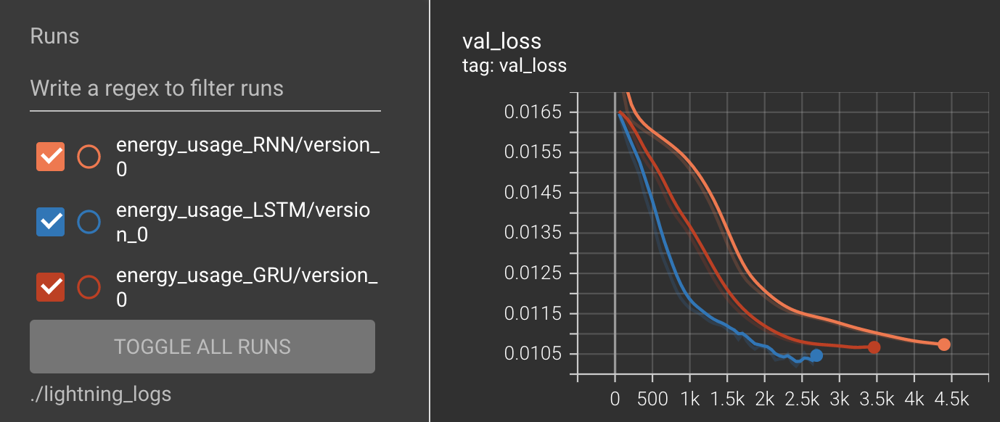

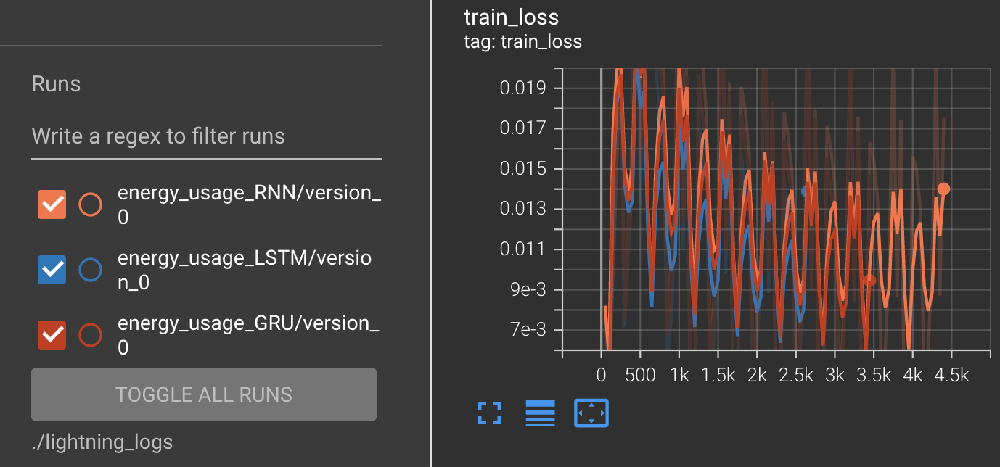

## Result analysis

Let's look at the model predictions on the test dataset and compare visually the predictions with the labels. To work with neural network outputs we need to scale them back using scaler

In [40]:
df = pd.read_csv('Steel_industry_data.csv', parse_dates=['date'])
df = df.sort_values(by='date').reset_index(drop=True)
test_data = df[train_size + val_size + 1:]
test_sequences_data = test_data.iloc[SEQUENCE_LENGTH:]
len(test_sequences_data), len(test_sequences)

(3383, 3383)

In [41]:
def get_pred_labels(model_name):
  checkpoint_path = f'./checkpoints_{model_name}/best_checkpoint.ckpt'

  trained_model = EnergyUsageModel.load_from_checkpoint(
      checkpoint_path,
      n_features=train_df.shape[1],
      n_hidden=N_HIDDEN,
      learning_rate=LEARNING_RATE, 
      model_name=model_name
  )
  trained_model.freeze()

  test_dataset = EnergyUsageDataset(test_sequences)
  predictions = []
  labels = []

  for item in tqdm(test_dataset): 
    sequence = item['sequence'][None, :]
    label = item['label']

    _, output = trained_model(sequence)

    predictions.append(output.item())
    labels.append(label.item())

  descaler = MinMaxScaler()
  descaler.min_, descaler.scale_ = scaler.min_[-1], scaler.scale_[-1]

  def descale(descaler, values):
    # Scaler works only with 2D data
    values_2d = np.array(values)[:, np.newaxis]
    return descaler.inverse_transform(values_2d).flatten()

  predictions_descaled = descale(descaler, predictions)
  labels_descaled = descale(descaler, labels)
  return predictions_descaled, labels_descaled

In [42]:
predictions_descaled_RNN, labels_descaled_RNN = get_pred_labels('RNN')
predictions_descaled_LSTM, _ = get_pred_labels('LSTM')
predictions_descaled_GRU, _ = get_pred_labels('GRU')

  0%|          | 0/3383 [00:00<?, ?it/s]

  0%|          | 0/3383 [00:00<?, ?it/s]

  0%|          | 0/3383 [00:00<?, ?it/s]

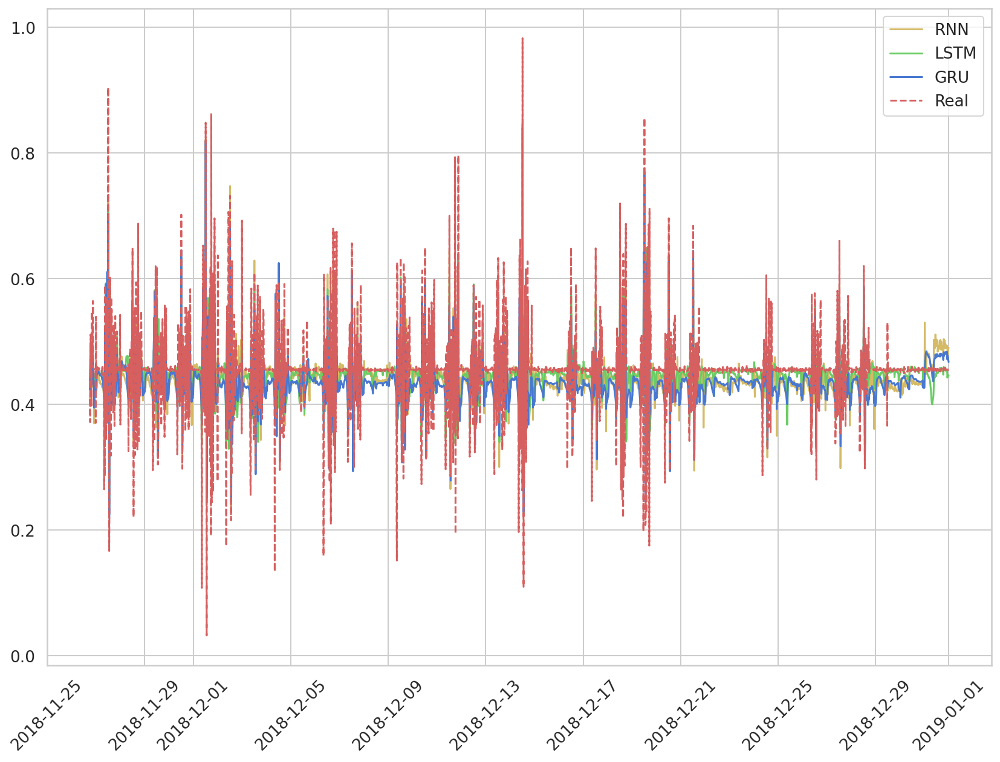

In [43]:
dates = test_sequences_data.date.tolist()

plt.plot_date(dates, predictions_descaled_RNN, '-', label='RNN', color='y')
plt.plot_date(dates, predictions_descaled_LSTM, '-', label='LSTM', color='g')
plt.plot_date(dates, predictions_descaled_GRU, '-', label='GRU', color='b')
plt.plot_date(dates, labels_descaled_RNN, '--', label='Real', color='r')
plt.xticks(rotation=45)
plt.legend()

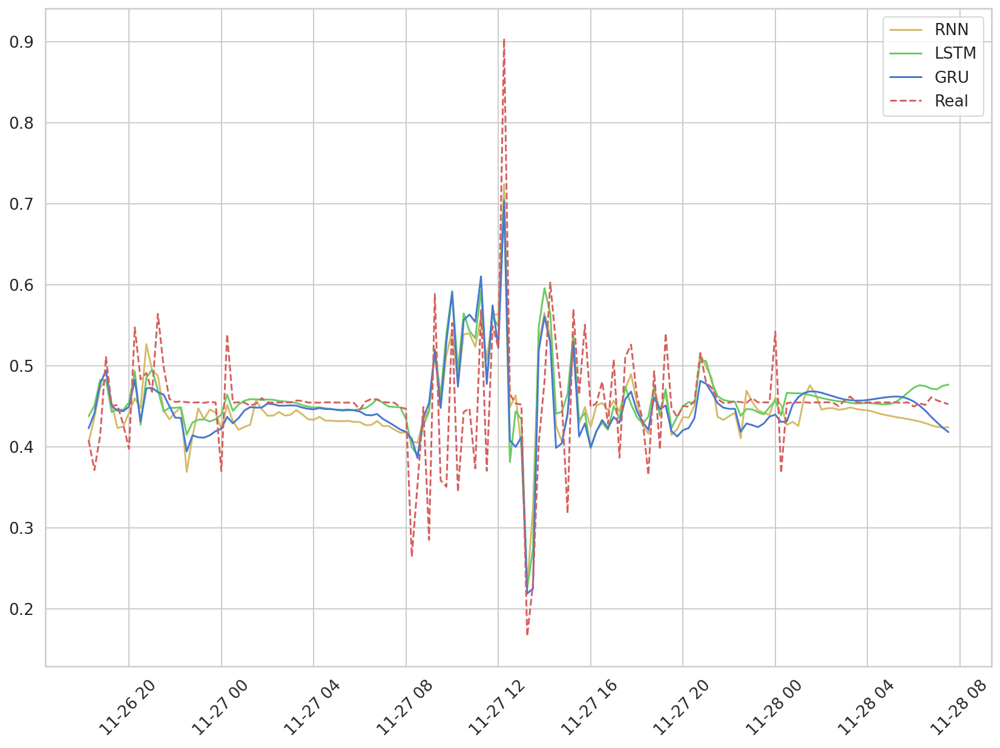

In [44]:
idx = 150

plt.plot_date(dates[:idx], predictions_descaled_RNN[:idx], '-', label='RNN', color='y')
plt.plot_date(dates[:idx], predictions_descaled_LSTM[:idx], '-', label='LSTM', color='g')
plt.plot_date(dates[:idx], predictions_descaled_GRU[:idx], '-', label='GRU', color='b')
plt.plot_date(dates[:idx], labels_descaled_RNN[:idx], '--', label='Real', color='r')

plt.xticks(rotation=45)
plt.legend()

## Conclusions

As we can see, the LSTM model is the best in terms of metrics and visual analysis. However, this model is also the largest by the number of parameters.

According to (R)MSE metrics RNN is approximately at the level of LSTM, but $R^2$ makes it clear that LSTM is still the best by the chosen metrics, although its $R^2$ is negative.

Final metrics for the models:

* RNN

```
test_mse           0.008577925153076649
test_r2            -1.209628701210022
test_rmse           0.09117578715085983
```

* LSTM
```
test_mse           0.009160450659692287
test_r2           -0.07401830703020096
test_rmse           0.09182663261890411
```

* GRU
```
test_mse           0.009597260504961014
test_r2            -0.9882407188415527
test_rmse           0.09624972939491272
```